# Importações e Bibliotecas

In [1]:
import random # Operações de aleatoriedade
import sys # Operações do sistema (print, etc)
import statistics # Operações de estatística

In [2]:
from market import Market, Produto # Importa a classe Market e a classe Produto

In [3]:
# Importações para construção gráfica do melhor indivíduo e do gráfico de evolução
from PIL import Image
from IPython.display import display
import plotly.graph_objects as go

# Valores Estáticos

In [4]:
CART: dict = {
    'Altura': 65,
    'Largura': 50,
    'Comprimento': 80,
    'PesoMaximo': 460*1000
}
CART['Capacidade'] = CART['Altura'] * CART['Largura'] * CART['Comprimento']

CART

{'Altura': 65,
 'Largura': 50,
 'Comprimento': 80,
 'PesoMaximo': 460000,
 'Capacidade': 260000}

In [5]:
MAX_MONEY: float = 750.0
MAX_ITEMS: int = 100
MAX_CARTS: int = 150
MAX_GENERATIONS: int = 3000
BESTS: int = 2

In [6]:
MED_PRICE: float = MAX_MONEY/MAX_ITEMS
f"Preço Médio por Produto: R${MED_PRICE:.2f}"

'Preço Médio por Produto: R$7.50'

# Funções

In [7]:
m: Market = Market(r"..\data\produtos2.csv")
print(m)

Market Info
8465 products loaded.


In [8]:
def mosaic(cart: list[Produto], row_quantity: int = 5, image_size: tuple[int, int] = (300, 300)) -> None:
    """Cria um mosaico com as imagens dos produtos do carrinho"""
    
    # Lista o objeto das imagens
    images: list[Image] = [product.show(popup=False).resize(image_size) for product in cart]
    
    # Calcula o tamanho do mosaico
    mosaic_size: tuple[int, int] = (image_size[0]*row_quantity, image_size[1]*((len(images)//row_quantity)+1))
    
    # Cria a imagem do mosaico
    mosaic: Image = Image.new('RGB', mosaic_size)
    
    # Coloca as imagens no mosaico
    for i, image in enumerate(images):
        mosaic.paste(image, (image_size[0]*(i%row_quantity), image_size[1]*(i//row_quantity)))
    
    # Exibe o mosaico
    display(mosaic) 

In [9]:
def plot_generations(data: dict[int, dict[str, float]]) -> None:
    """Plota um gráfico com os valores de cada geração"""
    
    # Extrai as iterações e os valores
    iterations: list = list(data.keys())
    max_values: list = [data[i]['max'] for i in iterations]
    min_values: list = [data[i]['min'] for i in iterations]
    avg_values: list = [data[i]['med'] for i in iterations]

    # Cria o objeto gráfico
    fig = go.Figure()

    # Adiciona as linhas para cada variável
    fig.add_trace(go.Scatter(x=iterations, y=max_values, mode='lines+markers', name='Max', line=dict(color="#a90000")))
    fig.add_trace(go.Scatter(x=iterations, y=min_values, mode='lines+markers', name='Min', line=dict(color="#007d1d")))
    fig.add_trace(go.Scatter(x=iterations, y=avg_values, mode='lines+markers', name='Medio', line=dict(color="#356fa8")))

    # Adiciona título e rótulos
    fig.update_layout(
                    title='Gráfico de Gerações',
                    xaxis_title='Iteração',
                    yaxis_title='Valores',
                    yaxis_type='log',  #! Define o eixo y como logarítmico
                    template='plotly'
                )

    # Exibe o gráfico
    fig.show()

In [ ]:
def calculate_desvio(data: dict, last: int = globals()['MAX_GENERATIONS']//5) -> float:
    """ Calcula o desvio padrão dos valores de uma lista de gerações das últimas N gerações """
    
    # Se a quantidade de dados for menor que o mínimo, retorna infinito
    if len(data) < last:
        return float("inf")
    
    else:
        values: list = list(data.values())[-last:]
        return statistics.stdev([value.get('min') for value in values])

In [11]:
def instanciate(cart: list[int]) -> list[Produto]:
    """Instancia uma lista de produtos a partir de uma lista de IDs"""
    
    return [m.get(i) for i in cart]

In [12]:
def info(cart: list[int]) -> str:
    """ Retorna uma string com as informações do indivíduo/carrinho """
    nota: float = avaliar(cart)
    cart: list[Produto] = instanciate(cart)
    return f"[INDIVÍDUO]\n\
Nota: {nota}\n\
Tamanho: {len(cart)}\n\n\
[INFORMAÇÕES DO CARRINHO]\n\
Preço Total: R${sum([product.price for product in cart]):.2f}\n\
Peso Total: {sum([product.weight for product in cart])/1000:.2f}g\n\
Volume Total: {sum([product.volume for product in cart]):.2f}cm³\n\
Preço médio: R${sum([product.price for product in cart])/len(cart)}\n\n\
[PRODUTOS]\n\
Menor preço: R${min([product.price for product in cart])}\n\
Maior preço: R${max([product.price for product in cart])}\n\
Menor peso: {min([product.weight for product in cart])}g\n\
Maior peso: {max([product.weight for product in cart])}g\n\
Menor volume: {min([product.volume for product in cart])}cm³\n\
Maior volume: {max([product.volume for product in cart])}cm³\n\n\
[CATEGORIAS]:\n{"\n".join([f"- {category}: {[product.category for product in cart].count(category)}" for category in set([product.category for product in cart])])}\n\n\
[LISTAGEM]\n{"\n".join([f"{product.name} \t R${product.price:.2f} \t {product.weight:.2f}g \t {product.volume:.2f}cm³" for product in cart])}\n\
"

# Genético

### Geração de Indivíduos

In [13]:
def gerar_carrinho(tamanho: int = globals()['MAX_ITEMS']) -> list[int]:
    compra = []

    while len(compra) < tamanho:
        item: int = m.random()
        compra.append(item)
        
    return compra

In [14]:
c: list[int] = gerar_carrinho()
c

[15095,
 544836,
 1376069,
 413227,
 132999,
 1623547,
 406952,
 282816,
 465407,
 424338,
 479853,
 434412,
 176313,
 795722,
 321907,
 116962,
 1404559,
 458667,
 76572,
 37810,
 452438,
 10930,
 1066861,
 462030,
 133784,
 154570,
 1551945,
 56009,
 1372737,
 333389,
 1245458,
 1623199,
 459759,
 1613998,
 1376368,
 1602261,
 430626,
 528829,
 1625178,
 9112,
 306312,
 57039,
 1618530,
 1615403,
 465035,
 617213,
 1592463,
 21733,
 301575,
 327411,
 1616543,
 83498,
 392020,
 68934,
 456241,
 339053,
 433162,
 430212,
 1372767,
 1590720,
 1569989,
 247456,
 401845,
 697101,
 180969,
 459333,
 1070275,
 1615679,
 409797,
 331474,
 693268,
 137221,
 134557,
 360209,
 467363,
 1606356,
 481183,
 23988,
 468811,
 68037,
 451644,
 396157,
 292011,
 399463,
 471817,
 430003,
 1435284,
 588896,
 1619292,
 807857,
 530309,
 362071,
 1583414,
 52448,
 456934,
 44847,
 824672,
 105770,
 1376745,
 433162]

### Geração de População Inicial

In [15]:
def gerar_populacao(tamanho: int = globals()['MAX_CARTS']) -> list[list[int]]:
    return [gerar_carrinho() for _ in range(tamanho)]

In [16]:
p: list[list[int]] = gerar_populacao()
p

[[108530,
  1619018,
  411240,
  421952,
  1607309,
  292234,
  412717,
  426618,
  1461109,
  410466,
  33672,
  388233,
  151194,
  1590396,
  619956,
  688271,
  1378057,
  452024,
  463601,
  475079,
  396844,
  197960,
  52461,
  456107,
  131345,
  327164,
  125340,
  1108003,
  1623181,
  1456285,
  443321,
  457439,
  1623250,
  428968,
  1458748,
  133853,
  123782,
  488056,
  1420722,
  330290,
  659748,
  1501497,
  1624718,
  472662,
  36020,
  112610,
  1602906,
  1416,
  75154,
  33920,
  270364,
  434976,
  324113,
  1446440,
  1447540,
  1607553,
  443836,
  626699,
  448295,
  134558,
  1618539,
  1623311,
  668563,
  355525,
  430624,
  1613319,
  468125,
  450262,
  462226,
  270819,
  101835,
  139654,
  1550036,
  1572648,
  420665,
  456104,
  1613500,
  49876,
  291629,
  807921,
  441870,
  464146,
  475050,
  269471,
  430264,
  710296,
  307527,
  495095,
  1433066,
  448125,
  1606345,
  1551010,
  222314,
  1468901,
  453497,
  1065154,
  433389,
  1241793,

### Avaliação

In [17]:
def avaliar(individuo: list[int]) -> float:
    valor_total: float = 0.0
    peso_total: float = 0.0
    volume_total: float = 0.0
    repeticoes: int = 0
    categorias: list = []
    
    pesos = {
    'essencial': 0.35,
    'alimentos': 0.25,
    'açougue': 0.10,
    'beleza-e-perfumaria': 0.05,
    'bebidas': 0.10,
    'bebidas-alcoolicas': 0.015,
    'bebidas-alcoolicas-': 0.015,
    'limpeza': 0.05,
    'cuidados-pessoais': 0.07
}


    
    for id in individuo:
        produto = m.get(id)
        volume_total+=produto.volume
        peso_total+=produto.weight
        valor_total+=produto.price
        categorias.append(produto.category)
        r=individuo.count(id)
        repeticoes+=(r*2) if r > 1 else 0
        
        
    nota = 1
    
    # Ônus
    nota*= max(1, volume_total - globals()['CART']['Capacidade'])
    nota*= max(1, peso_total - globals()['CART']['PesoMaximo'])
    nota*= max(1, valor_total - globals()['MAX_MONEY'])
    nota*= max(1, repeticoes)

    
    # quanto maior o peso da categoria, menor a penalizacao
    repeticoes_categoria = sum([(1 / pesos[c]) * categorias.count(c)**2 for c in set(categorias)])

    # atualizacao proporcional da nota
    # soma 1 para garantir que a nota nao seja multiplicada por um decimal, que consequentemente diminuiria a nota
    nota *= (1 + repeticoes_categoria / len(individuo))
    
    # Bônus
    nota/= len(set(categorias))**2
    
    return nota**2 


In [18]:
n: float = avaliar(c)
n

2607129873.575773

In [19]:
def mapear_notas(populacao: list[list[int]], order: str = 'asc') -> dict[float, list[int]]:
    notas: dict = {avaliar(individuo): individuo for individuo in populacao}
    
    if order == 'asc':
        return dict(sorted(notas.items()))
    
    else:
        return dict(sorted(notas.items(), reverse=True))

In [20]:
nt: dict[float, list[int]] = mapear_notas(p)
nt

{8675944.464621251: [1619257,
  563473,
  459466,
  429111,
  176129,
  1613391,
  1624085,
  376771,
  279928,
  1575887,
  324051,
  23041,
  1609410,
  201843,
  1623305,
  5299,
  307046,
  1520517,
  1065129,
  362588,
  1607220,
  433244,
  433491,
  1624711,
  55763,
  1601300,
  1560020,
  140618,
  38383,
  696307,
  396404,
  430627,
  693842,
  452759,
  92189,
  314481,
  313714,
  448848,
  791618,
  347709,
  276663,
  105622,
  1341702,
  1373117,
  1617146,
  162768,
  443255,
  433100,
  1570314,
  412861,
  585414,
  1602370,
  1624130,
  433163,
  586542,
  400525,
  402923,
  395577,
  69833,
  423462,
  588921,
  134026,
  57156,
  1615386,
  459409,
  1624095,
  1452967,
  449797,
  1386435,
  290414,
  1602252,
  1243542,
  1618531,
  1617344,
  365099,
  1570079,
  1606346,
  452869,
  417084,
  455503,
  1571420,
  162189,
  334191,
  331288,
  13424,
  1624405,
  427840,
  116487,
  803541,
  679348,
  114715,
  344412,
  418806,
  395853,
  1560786,
  146266,

### Seleção

In [21]:
def torneio(populacao: list[list[int]]) -> list[list[int]]:
    vencedores: list[list[int] | None] = []
    
    while len(vencedores) < 2:
        competidores: list[list[int]] = random.sample(populacao, 2)
        
        if avaliar(competidores[0]) < avaliar(competidores[1]):
            vencedor: list[int] = competidores[0]
        
        else:
            vencedor: list[int] = competidores[1]             

        if vencedor not in vencedores:    
            vencedores.append(vencedor)
    
    return vencedores

In [22]:
v1: list[list[int]] = torneio(p)
v1

[[1449980,
  223860,
  29078,
  87741,
  1624731,
  453451,
  100413,
  429669,
  1513728,
  107050,
  1613385,
  460941,
  457118,
  39657,
  1624377,
  1614845,
  57156,
  420586,
  547106,
  176465,
  472459,
  442317,
  461908,
  428318,
  430064,
  399446,
  423606,
  221903,
  594475,
  200486,
  795721,
  682265,
  51967,
  456713,
  754854,
  1452061,
  156639,
  5148,
  1602919,
  601012,
  163945,
  28056,
  148086,
  180902,
  434981,
  412866,
  475467,
  347709,
  292234,
  656734,
  308147,
  387461,
  305985,
  1606548,
  56297,
  569725,
  648359,
  1614791,
  581569,
  78765,
  1463453,
  1560781,
  430064,
  57156,
  91732,
  63266,
  1446440,
  151180,
  98340,
  55547,
  444036,
  472664,
  641718,
  1546915,
  13266,
  1121804,
  466640,
  697131,
  279390,
  647082,
  62145,
  443524,
  59364,
  1613349,
  1600708,
  494352,
  448125,
  21713,
  586550,
  55672,
  25719,
  100344,
  364119,
  399747,
  327854,
  402888,
  1551447,
  1625279,
  642765,
  1441479],


In [23]:
def roleta_viciada(populacao: list[list[int]]) -> list[list[int]]:
    fitness_list: list[float] = [1 / avaliar(individuo) for individuo in populacao]
    total_fitness: float = sum(fitness_list)
    probabilities: list[float] = [fitness / total_fitness for fitness in fitness_list]
    
    vencedores: list[list[int]] = random.choices(populacao, weights=probabilities, k=2)
    
    return vencedores

In [24]:
v2: list[list[int]] = roleta_viciada(p)
v2

[[433491,
  1602266,
  1619271,
  401841,
  9067,
  135269,
  190773,
  1458748,
  447652,
  1618661,
  11113,
  504778,
  1623622,
  1600558,
  1615790,
  88654,
  504784,
  1433060,
  449568,
  109209,
  412752,
  468981,
  324069,
  327165,
  199100,
  1606611,
  328948,
  76572,
  568662,
  174511,
  1606365,
  132607,
  1616714,
  32084,
  1614968,
  1607232,
  90061,
  1584220,
  110698,
  286732,
  459732,
  1618743,
  433821,
  1572644,
  193975,
  441805,
  1536235,
  568449,
  1618648,
  70562,
  456529,
  94333,
  424885,
  408427,
  1614789,
  68037,
  441870,
  273605,
  1615397,
  1619236,
  648351,
  221758,
  301016,
  1609272,
  152052,
  458212,
  221961,
  1052664,
  1075799,
  335996,
  329772,
  180902,
  190337,
  1609308,
  272988,
  137221,
  444518,
  443909,
  1617141,
  396156,
  5148,
  169199,
  710352,
  595306,
  1598127,
  1248483,
  58734,
  1624650,
  345468,
  803846,
  292149,
  481177,
  1546916,
  668563,
  1453007,
  1551387,
  1559878,
  154431,


In [25]:
def eugenia(populacao: list[list[int]], order: str = 'asc') -> list[list[int]]:
    notas: dict[float, list[int]] = mapear_notas(populacao, order)
    melhores: list[list[int]] = list(notas.values())[:globals()['BESTS']]
    
    return melhores

In [26]:
e: list[list[int]] = eugenia(p)
e

[[1619257,
  563473,
  459466,
  429111,
  176129,
  1613391,
  1624085,
  376771,
  279928,
  1575887,
  324051,
  23041,
  1609410,
  201843,
  1623305,
  5299,
  307046,
  1520517,
  1065129,
  362588,
  1607220,
  433244,
  433491,
  1624711,
  55763,
  1601300,
  1560020,
  140618,
  38383,
  696307,
  396404,
  430627,
  693842,
  452759,
  92189,
  314481,
  313714,
  448848,
  791618,
  347709,
  276663,
  105622,
  1341702,
  1373117,
  1617146,
  162768,
  443255,
  433100,
  1570314,
  412861,
  585414,
  1602370,
  1624130,
  433163,
  586542,
  400525,
  402923,
  395577,
  69833,
  423462,
  588921,
  134026,
  57156,
  1615386,
  459409,
  1624095,
  1452967,
  449797,
  1386435,
  290414,
  1602252,
  1243542,
  1618531,
  1617344,
  365099,
  1570079,
  1606346,
  452869,
  417084,
  455503,
  1571420,
  162189,
  334191,
  331288,
  13424,
  1624405,
  427840,
  116487,
  803541,
  679348,
  114715,
  344412,
  418806,
  395853,
  1560786,
  146266,
  1628298,
  27061

### Crossover e Mutação

In [27]:
def cruzamento(pais: list[list[int]], chance: float = 0.80, num_pontos_corte: int = 3) -> list[list[int]]:
    pai_1: list[int] = pais[0]
    pai_2: list[int] = pais[1]

    probabilidade: float = round(random.uniform(0, 1), 2)
    if probabilidade < chance:
        pontos_corte: list[int] = sorted(random.sample(range(1, len(pai_1)), num_pontos_corte))

        filho_1: list[int | None] = []
        filho_2: list[int | None] = []

        pos_inicio: int = 0
        for i in range(num_pontos_corte):
            pos_fim = pontos_corte[i]
            filho_1 += pai_1[pos_inicio:pos_fim] if i % 2 == 0 else pai_2[pos_inicio:pos_fim]
            filho_2 += pai_2[pos_inicio:pos_fim] if i % 2 == 0 else pai_1[pos_inicio:pos_fim]
            pos_inicio = pos_fim

        # Adicionando a parte restante do genoma após o último ponto de corte
        filho_1 += pai_2[pos_inicio:]
        filho_2 += pai_1[pos_inicio:]

        return [filho_1, filho_2]

    else:
        return [pai_1, pai_2]

In [28]:
f: list[list[int]] = cruzamento(v1)
f

[[1449980,
  223860,
  29078,
  87741,
  1624731,
  453451,
  333293,
  596258,
  184027,
  749592,
  1613385,
  460941,
  457118,
  39657,
  1624377,
  1614845,
  57156,
  420586,
  547106,
  176465,
  472459,
  442317,
  461908,
  428318,
  430064,
  399446,
  423606,
  221903,
  594475,
  200486,
  795721,
  682265,
  51967,
  456713,
  754854,
  1452061,
  156639,
  5148,
  1602919,
  601012,
  163945,
  28056,
  148086,
  180902,
  434981,
  412866,
  475467,
  347709,
  292234,
  656734,
  308147,
  387461,
  305985,
  1606548,
  56297,
  569725,
  648359,
  1614791,
  581569,
  78765,
  1463453,
  1560781,
  430064,
  57156,
  91732,
  63266,
  1446440,
  151180,
  428531,
  569726,
  1059418,
  1059418,
  119902,
  495095,
  1617339,
  421093,
  1615391,
  413317,
  1420314,
  1373102,
  600969,
  427650,
  80070,
  433244,
  144277,
  473497,
  1584212,
  470469,
  13905,
  468603,
  104125,
  1466404,
  446237,
  1618649,
  32084,
  175824,
  434910,
  441806,
  478311,
  169

In [29]:
def mutar(populacao: list[list[int]], chance = 0.03) -> list[list[int]]: 
    mutados: list[list[int]] = []

    for individuo in populacao:
        for pos, alelo in enumerate(individuo):
            mutacao: float = round(random.uniform(0, 1), 3)

            if mutacao < chance:
                novo_gene: str = m.random(ignore_case=[alelo,]) 
                individuo: str = individuo[:pos] + [novo_gene] + individuo[pos+1:]

        mutados.append(individuo)
    
    return mutados

In [30]:
mt: list[list[Produto]] = mutar(f)
mt

[[1449980,
  223860,
  29078,
  87741,
  1624731,
  453451,
  333293,
  596258,
  184027,
  749592,
  1613385,
  460941,
  457118,
  39657,
  1624377,
  1614845,
  57156,
  420586,
  547106,
  176465,
  472459,
  442317,
  461908,
  428318,
  430064,
  399446,
  423606,
  221903,
  594475,
  200486,
  795721,
  682265,
  51967,
  456713,
  754854,
  1452061,
  156639,
  5148,
  1602919,
  601012,
  163945,
  28056,
  148086,
  180902,
  434981,
  412866,
  475467,
  347709,
  292234,
  656734,
  308147,
  387461,
  305985,
  1606548,
  56297,
  569725,
  648359,
  1614791,
  581569,
  78765,
  1463453,
  1560781,
  430064,
  171235,
  91732,
  63266,
  1446440,
  151180,
  428531,
  569726,
  1059418,
  1059418,
  119902,
  1340695,
  1617339,
  421093,
  1615391,
  413317,
  1420314,
  1373102,
  600969,
  427650,
  80070,
  433244,
  144277,
  473497,
  1584212,
  470469,
  13905,
  468603,
  104125,
  1466404,
  446237,
  1618649,
  32084,
  175824,
  434910,
  441806,
  478311,
  1

# Execução Principal

In [31]:
relatorio: dict[dict[str: float]] = {}

In [32]:
if __name__ == '__main__':
    i: int = 1
    populacao_atual: list[list[int]] = gerar_populacao()
    notas: list[float | None] = list(mapear_notas(populacao_atual).keys())
    
    while (i <= MAX_GENERATIONS) and (calculate_desvio(relatorio) > 0):
        geracao: list[list[int]] = []
        
        while len(geracao) < (MAX_CARTS - BESTS):
            pais: list[list[int]] = torneio(populacao_atual)
            # pais: list[list[int]] = roleta_viciada(populacao_atual)
            
            filhos: list[list[int]] = mutar(cruzamento(pais))
            geracao.extend(filhos)
            
        geracao.extend(eugenia(populacao_atual))
        
        populacao_atual: list[list[int]] = geracao.copy()
        notas: list[float] = list(mapear_notas(populacao_atual).keys())
        relatorio[i] = {'max': max(notas), 'min': min(notas), 'med': statistics.median(notas)}
        sys.stdout.write(f'\rGeração: {i}\n')
        i+=1

Geração: 1
Geração: 2
Geração: 3
Geração: 4
Geração: 5
Geração: 6
Geração: 7
Geração: 8
Geração: 9
Geração: 10
Geração: 11
Geração: 12
Geração: 13
Geração: 14
Geração: 15
Geração: 16
Geração: 17
Geração: 18
Geração: 19
Geração: 20
Geração: 21
Geração: 22
Geração: 23
Geração: 24
Geração: 25
Geração: 26
Geração: 27
Geração: 28
Geração: 29
Geração: 30
Geração: 31
Geração: 32
Geração: 33
Geração: 34
Geração: 35
Geração: 36
Geração: 37
Geração: 38
Geração: 39
Geração: 40
Geração: 41
Geração: 42
Geração: 43
Geração: 44
Geração: 45
Geração: 46
Geração: 47
Geração: 48
Geração: 49
Geração: 50
Geração: 51
Geração: 52
Geração: 53
Geração: 54
Geração: 55
Geração: 56
Geração: 57
Geração: 58
Geração: 59
Geração: 60
Geração: 61
Geração: 62
Geração: 63
Geração: 64
Geração: 65
Geração: 66
Geração: 67
Geração: 68
Geração: 69
Geração: 70
Geração: 71
Geração: 72
Geração: 73
Geração: 74
Geração: 75
Geração: 76
Geração: 77
Geração: 78
Geração: 79
Geração: 80
Geração: 81
Geração: 82
Geração: 83
Geração: 84
G

In [33]:
for gen, data in relatorio.items():
    print(f'Geração: {gen} - {data}')

Geração: 1 - {'max': 3.393442873082421e+22, 'min': 5063398.36260238, 'med': 856284544.7696147}
Geração: 2 - {'max': 3.463719876847177e+18, 'min': 3637089.9974210006, 'med': 32545465.16853171}
Geração: 3 - {'max': 9523538941.957705, 'min': 3637089.9974210006, 'med': 22784973.88776297}
Geração: 4 - {'max': 7295491889.729079, 'min': 3472833.143683034, 'med': 16372525.850423843}
Geração: 5 - {'max': 6.27821048347946e+20, 'min': 2541854.5183023303, 'med': 14177571.291541405}
Geração: 6 - {'max': 1.7968204755399818e+18, 'min': 2508308.102302365, 'med': 9758589.19143275}
Geração: 7 - {'max': 5.005533157239894e+18, 'min': 2508308.102302365, 'med': 8919751.889223073}
Geração: 8 - {'max': 2.410486215887493e+19, 'min': 1912290.0611598801, 'med': 6838463.059126397}
Geração: 9 - {'max': 2.0905540228199285e+20, 'min': 1912290.0611598801, 'med': 6033638.921193119}
Geração: 10 - {'max': 6354169318.674058, 'min': 1912290.0611598801, 'med': 5664301.753060876}
Geração: 11 - {'max': 8.909977827240357e+19,

In [34]:
plot_generations(relatorio)

In [35]:
best_individual: list[int] = eugenia(populacao_atual)[0]
best_cart: list[Produto] = instanciate(best_individual)

print(f"Última Geração: {i}\n\n", info(best_individual))

Última Geração: 2764

 [INDIVÍDUO]
Nota: 1.5721415178884646
Tamanho: 100

[INFORMAÇÕES DO CARRINHO]
Preço Total: R$749.64
Peso Total: 34.82g
Volume Total: 114445.78cm³
Preço médio: R$7.4963999999999995

[PRODUTOS]
Menor preço: R$1.49
Maior preço: R$25.69
Menor peso: 8.9g
Maior peso: 2170.0g
Menor volume: 1.0cm³
Maior volume: 34656.0cm³

[CATEGORIAS]:
- bebidas: 10
- bebidas-alcoolicas-: 2
- cuidados-pessoais: 7
- essencial: 36
- bebidas-alcoolicas: 1
- alimentos: 25
- beleza-e-perfumaria: 4
- limpeza: 5
- açougue: 10

[LISTAGEM]
Vinagre de Arroz CASTELO 750ml 	 R$9.39 	 780.00g 	 1632.00cm³
Cerveja CARACU Escura Lata 350ml 	 R$4.69 	 374.00g 	 540.14cm³
Molho de Tomate Caseiro Manjericão Pomarola Sachê 300g 	 R$4.99 	 312.00g 	 912.00cm³
Arroz Integral 8 Grãos com Quinoa Biju Pacote 500g 	 R$11.49 	 542.90g 	 945.00cm³
Repelente Pastilha Elétrico 12 Noites Raid Pacote Leve 12 Pague 10 Unidades Refil 	 R$7.59 	 13.20g 	 32.85cm³
Leite Longa Vida Desnatado DÁLIA 1 Litro 	 R$5.39 	 1072.0

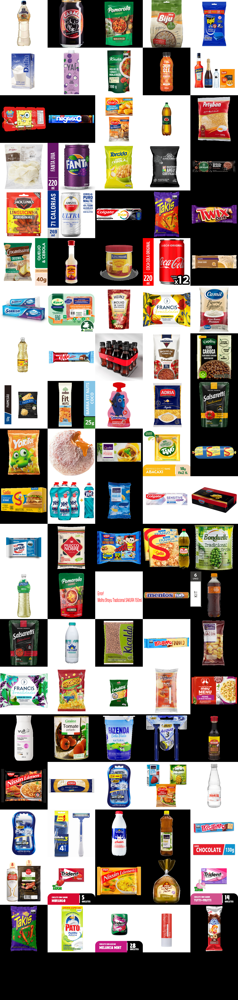

In [36]:
mosaic(best_cart)